# PupilAnalysis_Pain - Data Processing
    
#### This algorithm is for:
- Perform signal processing and preprocessing
    - Remove empty cells (outliers)
    - Calculate signal loss
    - Rebuild signal loss intervals (data missing)
    - Smooth the signal

#### Important considerations before exporting Tobii database to Python
- The Tobii Tx300 equipment has an acquisition rate of 300Hz
- Tobii Studio exports up to 86 variables
- Long experiments or with many volunteers can generate very large databases
     - For example, a 5 minute experiment performed with 50 participants will generate a matrix with 4,500,000 lines (5 minutes X 60 seconds X 50 participants X 300Hz = 4,500,000)
     - In this example, when exporting all possible variables, a matrix of [4500000x86] will be obtained and this will generate some unnecessary difficulties when loading the database in other programs. So to optimize the process, avoid exporting variables that you will not use.
- Essentially necessary variables for this script:
    - ParticipantName
    - MediaName
    - PupilLeft
    - PupilRight

### Step 0: Load Necessary Libraries

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
from scipy.signal import savgol_filter
from tqdm import tqdm
import time

### Step 1: Load the dataset

In [38]:
# Enter the path where the exported database was stored
# Put the letter r before the path to avoid misinterpretation of the backslash \
#df = pd.read_csv(r"C:\Users\gisel\Downloads\EscalasDor_Data_Export.tsv", sep="\t") # Read file
df = pd.read_csv(r"C:\Users\rafae\Desktop\EscalasDor_Data_Export.tsv", sep="\t") # Read file
# A "DtypeWarning" alert message will probably appear because there is more than one data type in the same column,
# this issue will be addressed in steps 3 and 4.

C:\Users\rafae\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


### Step 2: View loaded data properties

In [39]:
# Check in which pupil there was the greatest signal loss
print("Amostras da pupila esquerda:",df.PupilLeft.count()) # Print number of valid Samples (without NaN) from the Left Pupil
print("Amostras da pupila direita:",df.PupilRight.count()) # Print number of valid Samples (without NaN) from the Right Pupil

Amostras da pupila esquerda: 13627438
Amostras da pupila direita: 13664868


In [40]:
print("Estímulos:",np.unique(df[df["MediaName"].notna()].MediaName)) # Filter NaN and print name of all stimuli

Estímulos: ['03_111418.bmp' '05_105754_110248.bmp' '05_110222.bmp'
 '06_112348_145026.bmp' '06_112553.bmp' '07_114829.bmp' '07_114907.bmp'
 '08_150034_150434.bmp' '08_150212.bmp' '09_141714.bmp'
 '09_142318_142459.bmp' '15_151515.bmp' '15_151810.bmp' '19_114838.bmp'
 '19_114922.bmp' '20_122223.bmp' '20_122527.bmp' '21_124220.bmp'
 '24_150608.bmp' '24_150657_150701.bmp' '25_103048.bmp' '25_103203.bmp'
 'cross.jpg']


In [41]:
print("Participantes:",np.unique(df.ParticipantName)) # Prints the identification of all subjects

Participantes: ['P10' 'P100' 'P101' 'P102' 'P103' 'P104' 'P105' 'P106' 'P107' 'P108'
 'P109' 'P11' 'P110' 'P111' 'P112' 'P113' 'P114' 'P115' 'P116' 'P117'
 'P118' 'P119' 'P12' 'P120' 'P121' 'P122' 'P123' 'P124' 'P125' 'P126'
 'P127' 'P128' 'P129' 'P13' 'P130' 'P131' 'P132' 'P133' 'P134' 'P135'
 'P136' 'P137' 'P138' 'P139' 'P14' 'P140' 'P141' 'P142' 'P143' 'P144'
 'P145' 'P146' 'P147' 'P148' 'P149' 'P15' 'P150' 'P151' 'P152' 'P153'
 'P154' 'P155' 'P156' 'P157' 'P158' 'P159' 'P16' 'P160' 'P161' 'P162'
 'P163' 'P164' 'P165' 'P166' 'P17' 'P18' 'P19' 'P20' 'P21' 'P22' 'P23'
 'P24' 'P25' 'P26' 'P27' 'P28' 'P29' 'P30' 'P31' 'P32' 'P33' 'P34' 'P35'
 'P36' 'P37' 'P38' 'P39' 'P40' 'P41' 'P42' 'P43' 'P44' 'P45' 'P46' 'P47'
 'P48' 'P49' 'P50' 'P51' 'P52' 'P53' 'P54' 'P55' 'P56' 'P57' 'P58' 'P59'
 'P60' 'P61' 'P62' 'P63' 'P64' 'P65' 'P66' 'P67' 'P68' 'P69' 'P70' 'P71'
 'P72' 'P73' 'P74' 'P75' 'P76' 'P77' 'P78' 'P79' 'P80' 'P81' 'P82' 'P83'
 'P84' 'P85' 'P86' 'P87' 'P88' 'P89' 'P90' 'P91' 'P92' 'P93

In [42]:
# Check if it is necessary to exclude or convert the type of some variable
print(df.info()) # Print summary of data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15270651 entries, 0 to 15270650
Data columns (total 13 columns):
 #   Column                     Dtype  
---  ------                     -----  
 0   ParticipantName            object 
 1   RecordingName              object 
 2   MediaName                  object 
 3   LocalTimeStamp             object 
 4   FixationIndex              float64
 5   GazeEventDuration          float64
 6   FixationPointX (MCSpx)     float64
 7   FixationPointY (MCSpx)     float64
 8   SaccadicAmplitude          object 
 9   AbsoluteSaccadicDirection  object 
 10  PupilLeft                  object 
 11  PupilRight                 object 
 12  Unnamed: 12                float64
dtypes: float64(5), object(8)
memory usage: 1.5+ GB
None


### Step 3: Organize and clean the dataset
- In this step, instead of excluding the data that you are not going to use, select only the data that you are going to use and overwrite the database

In [43]:
# Select only the columns you are going to user
df = df[['ParticipantName','MediaName','PupilRight','FixationIndex','FixationPointX (MCSpx)','FixationPointY (MCSpx)']]
# Rename the Pupil with the most recorded samples to "Pupil"
df.rename(columns = {'PupilRight':'Pupil','FixationIndex':'FI','FixationPointX (MCSpx)':'X','FixationPointY (MCSpx)':'Y'}, inplace = True)
display(df)

,ParticipantName,MediaName,Pupil,FI,X,Y
0,P10,NaN,"4,48",NaN,NaN,NaN
1,P10,NaN,"4,51",1.0,NaN,NaN
2,P10,NaN,"4,52",1.0,NaN,NaN
3,P10,NaN,"4,51",1.0,NaN,NaN
4,P10,NaN,"4,50",1.0,NaN,NaN
...,...,...,...,...,...,...
15270646,P166,NaN,NaN,NaN,NaN,NaN
15270647,P166,NaN,NaN,NaN,NaN,NaN
15270648,P166,NaN,NaN,NaN,NaN,NaN
15270649,P166,NaN,NaN,NaN,NaN,NaN


In [44]:
# List the subjects to be used (Name of the Participant associated with the Tobii Studio recording)
# medicos = 44
# op (outros profissionais) = 40
# pais = 29
# leigos = 29 # Removed P62
# profissionais = medicos + Op  = 84
# p = nao_profissionais = leigos + pais = 58 # Removed P62

medicos = ['P15','P33','P26','P27','P28','P31','P30','P38','P36','P75', 'P66',
                 'P46','P48','P47','P85','P90','P83','P89','P84','P93','P94','P100',
                 'P99','P103', 'P146','P143', 'P142', 'P141', 'P134', 'P133', 'P124',
                 'P123', 'P166', 'P165', 'P164', 'P162', 'P163', 'P151', 'P148', 'P149',
                 'P152', 'P153', 'P157', 'P160']
op = ['P74', 'P73', 'P71', 'P55', 'P54', 'P69','P63','P32', 'P39', 'P29', 'P21', 'P22','P23',
                 'P19', 'P17', 'P80', 'P82','P91','P92', 'P95', 'P96', 'P97', 'P98', 'P110',
                'P147','P112', 'P115', 'P127','P128', 'P129', 'P130', 'P131', 'P132', 'P135',
                 'P136', 'P137', 'P138', 'P139', 'P144', 'P145']
pais = ['P53','P52','P51','P49','P42','P40','P41','P35','P34','P20','P86','P81',
                    'P76','P77','P87','P104','P102','P107','P120', 'P121', 'P122', 'P114', 'P117',
                    'P125', 'P126', 'P155', 'P154', 'P159', 'P158']
# P62 removed
leigos = ['P70', 'P60', 'P59', 'P58','P64', 'P65', 'P56', 'P57', 'P67', 'P68', 'P45',
                    'P44', 'P43', 'P61','P16', 'P37', 'P50','P78', 'P88', 'P79', 'P101', 'P105',
                    'P106', 'P108', 'P113', 'P118', 'P119', 'P116', 'P161']

profissionais = medicos + op

nao_profissionais = pais + leigos 

p = profissionais + nao_profissionais

df = df[df.ParticipantName.isin(p)] # Select only participants from the list and overwrite the dataset
display(df)

,ParticipantName,MediaName,Pupil,FI,X,Y
560836,P15,NaN,NaN,NaN,NaN,NaN
560837,P15,NaN,NaN,NaN,NaN,NaN
560838,P15,NaN,NaN,NaN,NaN,NaN
560839,P15,NaN,NaN,NaN,NaN,NaN
560840,P15,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
15270646,P166,NaN,NaN,NaN,NaN,NaN
15270647,P166,NaN,NaN,NaN,NaN,NaN
15270648,P166,NaN,NaN,NaN,NaN,NaN
15270649,P166,NaN,NaN,NaN,NaN,NaN


In [45]:
# List the MediaName to be used (Name of the media/stimuli element from the Tobii Studio test timeline)
com_dor = ["05_105754_110248.bmp","06_112553.bmp","07_114907.bmp","08_150212.bmp","09_142318_142459.bmp",
           "15_151810.bmp","19_114922.bmp","20_122527.bmp","24_150657_150701.bmp","25_103203.bmp"] 
sem_dor = ["05_110222.bmp","06_112348_145026.bmp","07_114829.bmp", "08_150034_150434.bmp","09_141714.bmp",
           "15_151515.bmp","19_114838.bmp","20_122223.bmp","24_150608.bmp","25_103048.bmp"]
stimuli = com_dor + sem_dor # Concatenate lists

df = df[df.MediaName.isin(stimuli)] # Select only stimuli from the list and overwrite the dataset
display(df)

,ParticipantName,MediaName,Pupil,FI,X,Y
575864,P15,19_114922.bmp,"3,37",211.0,449.0,207.0
575865,P15,19_114922.bmp,"3,27",211.0,449.0,207.0
575866,P15,19_114922.bmp,"3,29",211.0,449.0,207.0
575867,P15,19_114922.bmp,"3,35",211.0,449.0,207.0
575868,P15,19_114922.bmp,"3,36",211.0,449.0,207.0
...,...,...,...,...,...,...
15268840,P166,20_122527.bmp,"3,14",1062.0,336.0,335.0
15268841,P166,20_122527.bmp,"3,14",1062.0,336.0,335.0
15268842,P166,20_122527.bmp,"3,17",1062.0,336.0,335.0
15268843,P166,20_122527.bmp,"3,13",1062.0,336.0,335.0


### Step 4: Fix data type and format

In [46]:
df["Pupil"] = df["Pupil"].replace(",",".", regex=True) # Replace comma with dot, use regex parameter to apply to df 
df["Pupil"] = pd.to_numeric(df["Pupil"]) # Convert data type to numeric (Float)
display(df)

,ParticipantName,MediaName,Pupil,FI,X,Y
575864,P15,19_114922.bmp,3.37,211.0,449.0,207.0
575865,P15,19_114922.bmp,3.27,211.0,449.0,207.0
575866,P15,19_114922.bmp,3.29,211.0,449.0,207.0
575867,P15,19_114922.bmp,3.35,211.0,449.0,207.0
575868,P15,19_114922.bmp,3.36,211.0,449.0,207.0
...,...,...,...,...,...,...
15268840,P166,20_122527.bmp,3.14,1062.0,336.0,335.0
15268841,P166,20_122527.bmp,3.14,1062.0,336.0,335.0
15268842,P166,20_122527.bmp,3.17,1062.0,336.0,335.0
15268843,P166,20_122527.bmp,3.13,1062.0,336.0,335.0


### Step 5: Analyze signal loss by participant
- Commonly, the criterion of 70% of valid samples is used
    - Check if the signal acquisition rate is equal to or higher than the stipulated criterion
    - Remove participants with acquisition rate below the criteria

In [47]:
lista1 = []; lista2 = []; lista3 = []  # Declare lists to store the amount of samples
# Loop repeat to list all participants
for i in p:
    dfi = df["ParticipantName"]==i # Filter the participant
    lista1.append(len(df[dfi])) # Filter all samples of the participant
    lista2.append(len(df[dfi][df[dfi]["Pupil"].notna()])) # Filter only samples recorded, without NaN
    lista3.append(len(df[dfi][df[dfi]["Pupil"].notna()])/len(df[dfi])) # Calculate rec rate
report = pd.DataFrame(data={'AllSamples':lista1,'ValidSamples':lista2,'RecRate':lista3}, index=[p]) # Create Report
display(report) 

,AllSamples,ValidSamples,RecRate
P15,42095,41925,0.995962
P33,42099,39423,0.936436
P26,42096,38978,0.925931
P27,42098,40898,0.971495
P28,42094,39819,0.945954
...,...,...,...
P113,42097,36609,0.869634
P118,42095,38045,0.903789
P119,42098,41300,0.981044
P116,42096,31371,0.745225


In [27]:
# Check if there is any participant with acquisition rate below the criteria
criterio = 0.7 # Define criteria (normally 70% is used)
dfc = report['RecRate'] < criterio 
display(report[dfc])
# If you need to remove a participant, edit the 2nd part of step 3

,AllSamples,ValidSamples,RecRate


## Step 6 - Data processing
- Identification of peak pupillary dilation of all participants by image.
- Identification of the reference index of the peak of dilation.
- Identification of the three fixations before the peak. 
- Identification of the first fixation.
- Conception of new date with curated data

In [223]:
df2 = pd.DataFrame(columns=['ParticipantName','MediaName','Pupil','FI','X','Y']) # Declare an auxiliary DataFrame

for k in tqdm(range(0,len(p))):
    for j in range(0,len(stimuli)):
        dftemp = df.loc[(df["ParticipantName"]==p[k])&(df["MediaName"]==stimuli[j])] # Filter participant and stimuli
        pico = dftemp.loc[dftemp['Pupil']==dftemp['Pupil'].max()]
        dfpico = pd.DataFrame({'ParticipantName':[p[k]],'MediaName':[stimuli[j]],'Pupil':[pico['Pupil'].max()],
                                'FI':[pico['FI'].max()-dftemp['FI'].min()],'X':[pico['X'].max()],'Y':[pico['Y'].max()]})
        
        base = dftemp.loc[dftemp['FI']==dftemp['FI'].min()]
        dfbase = pd.DataFrame({'ParticipantName':[p[k]],'MediaName':[stimuli[j]],'Pupil':[base['Pupil'].max()],
                                'FI':[1],'X':[base['X'].max()],'Y':[base['Y'].max()]})
        
        if pico['FI'].max()-dftemp['FI'].min() >= 4:  
            pico1 = dftemp.loc[dftemp['FI']==(pico['FI'].max()-1)]
            dfpico1 = pd.DataFrame({'ParticipantName':[p[k]],'MediaName':[stimuli[j]],'Pupil':[pico1['Pupil'].max()],
                                'FI':[pico1['FI'].max()-dftemp['FI'].min()],'X':[pico1['X'].max()],'Y':[pico1['Y'].max()]})
            pico2 = dftemp.loc[dftemp['FI']==(pico1['FI'].max()-1)]
            dfpico2 = pd.DataFrame({'ParticipantName':[p[k]],'MediaName':[stimuli[j]],'Pupil':[pico2['Pupil'].max()],
                                'FI':[pico2['FI'].max()-dftemp['FI'].min()],'X':[pico2['X'].max()],'Y':[pico2['Y'].max()]})
            pico3 = dftemp.loc[dftemp['FI']==(pico2['FI'].max()-1)]
            dfpico3 = pd.DataFrame({'ParticipantName':[p[k]],'MediaName':[stimuli[j]],'Pupil':[pico3['Pupil'].max()],
                                'FI':[pico3['FI'].max()-dftemp['FI'].min()],'X':[pico3['X'].max()],'Y':[pico3['Y'].max()]})
            df2 = pd.concat([df2,dfpico,dfpico1,dfpico2,dfpico3,dfbase]) # Add data in auxiliary DataFrame
        
        if pico['FI'].max()-dftemp['FI'].min() == 3:  
            pico1 = dftemp.loc[dftemp['FI']==(pico['FI'].max()-1)]
            dfpico1 = pd.DataFrame({'ParticipantName':[p[k]],'MediaName':[stimuli[j]],'Pupil':[pico1['Pupil'].max()],
                                'FI':[pico1['FI'].max()-dftemp['FI'].min()],'X':[pico1['X'].max()],'Y':[pico1['Y'].max()]})
            pico2 = dftemp.loc[dftemp['FI']==(pico1['FI'].max()-1)]
            dfpico2 = pd.DataFrame({'ParticipantName':[p[k]],'MediaName':[stimuli[j]],'Pupil':[pico2['Pupil'].max()],
                                'FI':[pico2['FI'].max()-dftemp['FI'].min()],'X':[pico2['X'].max()],'Y':[pico2['Y'].max()]})
            df2 = pd.concat([df2,dfpico,dfpico1,dfpico2,dfbase]) # Add data in auxiliary DataFrame
            
        if pico['FI'].max()-dftemp['FI'].min() == 2:  
            pico1 = dftemp.loc[dftemp['FI']==(pico['FI'].max()-1)]
            dfpico1 = pd.DataFrame({'ParticipantName':[p[k]],'MediaName':[stimuli[j]],'Pupil':[pico1['Pupil'].max()],
                                'FI':[pico1['FI'].max()-dftemp['FI'].min()],'X':[pico1['X'].max()],'Y':[pico1['Y'].max()]})
            df2 = pd.concat([df2,dfpico,dfpico1,dfbase]) # Add data in auxiliary DataFrame

100%|██████████████████████████████████████████████████████████████████████████████| 142/142 [1:13:11<00:00, 30.93s/it]


## Step 7 - Write processed file

In [226]:
# Save the dataset
df2.to_csv('area_interesse_pupila.csv', index=False, sep="\t") # Write file

In [ ]:
# arredondar dados do índice

### Step 8 - Visual analysis of the result

In [239]:
from skimage import io
import seaborn as sns
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [297]:
# Function to print original image (stimuli) + coordinates of peak pupil,
def result_id(id):
    ec = ['red','orange','yellow','green','black']
    plt.figure(figsize=(20,15)) # Set plot area
    plt.subplot(3,2,1) # Set position of subplot
    plt.imshow(io.imread(id)) # Print orriginal imagem
    plt.title('Classe: Médicos', fontsize=20, loc='left') # Set title
    plt.axis('off') # Remove axis
    for i in medicos:
        pl_id = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==id)]
        if len(pl_id) == 5:
            plt.scatter(pl_id['X'],pl_id['Y'], color = ec)
    
    plt.subplot(3,2,3) # Set position of subplot
    plt.imshow(io.imread(id)) # Print orriginal imagem
    plt.title('Classe: Outros Profissionais', fontsize=20, loc='left') # Set title
    plt.axis('off') # Remove axis
    for i in op:
        pl_id = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==id)]
        if len(pl_id) == 5:
            plt.scatter(pl_id['X'],pl_id['Y'], color = ec)

    plt.subplot(3,2,5) # Set position of subplot
    plt.imshow(io.imread(id)) # Print orriginal imagem
    plt.title('Classe: Profissionais', fontsize=20, loc='left') # Set title
    plt.axis('off') # Remove axis
    for i in profissionais:
        pl_id = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==id)]
        if len(pl_id) == 5:
            plt.scatter(pl_id['X'],pl_id['Y'], color = ec)
    
    plt.subplot(3,2,2) # Set position of subplot
    plt.imshow(io.imread(id)) # Print orriginal imagem
    plt.title('Classe: Pais', fontsize=20, loc='left') # Set title
    plt.axis('off') # Remove axis
    for i in pais:
        pl_id = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==id)]
        if len(pl_id) == 5:
            plt.scatter(pl_id['X'],pl_id['Y'], color = ec)

    plt.subplot(3,2,4) # Set position of subplot
    plt.imshow(io.imread(id)) # Print orriginal imagem
    plt.title('Classe: Leigos', fontsize=20, loc='left') # Set title
    plt.axis('off') # Remove axis
    for i in leigos:
        pl_id = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==id)]
        if len(pl_id) == 5:
            plt.scatter(pl_id['X'],pl_id['Y'], color = ec)

    plt.subplot(3,2,6) # Set position of subplot
    plt.imshow(io.imread(id)) # Print orriginal imagem
    plt.title('Classe: Não Profissionais', fontsize=20, loc='left') # Set title
    plt.axis('off') # Remove axis
    for i in nao_profissionais:
        pl_id = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==id)]
        if len(pl_id) == 5:
            plt.scatter(pl_id['X'],pl_id['Y'], color = ec)
    return

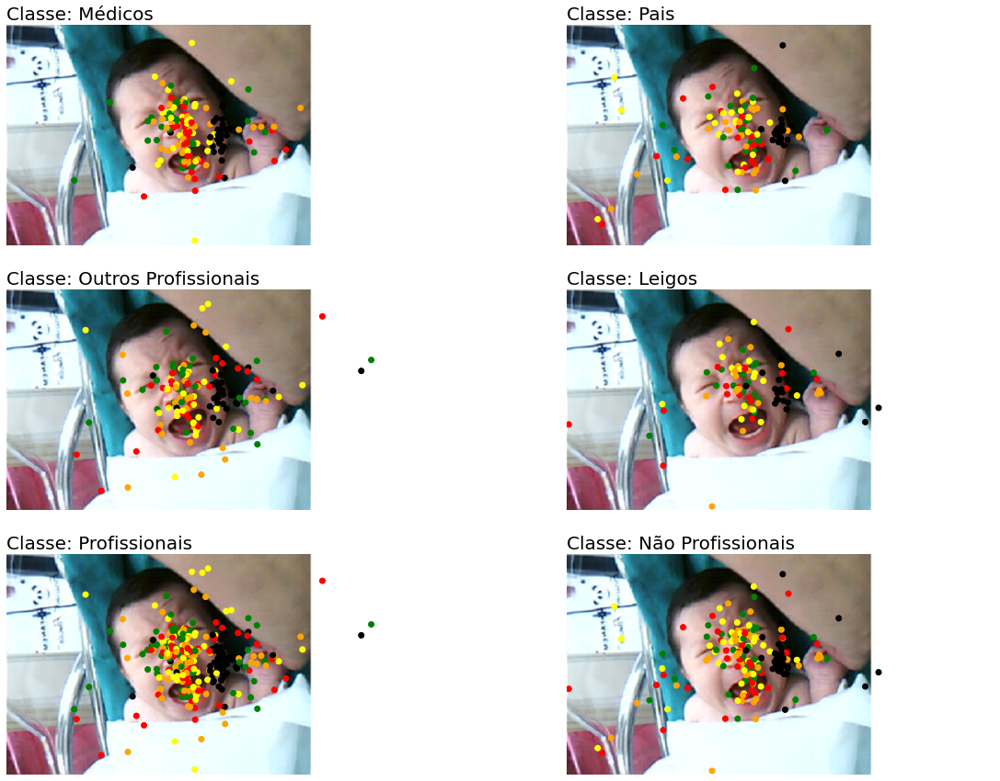

In [298]:
result_id(stimuli[0]) # Pain

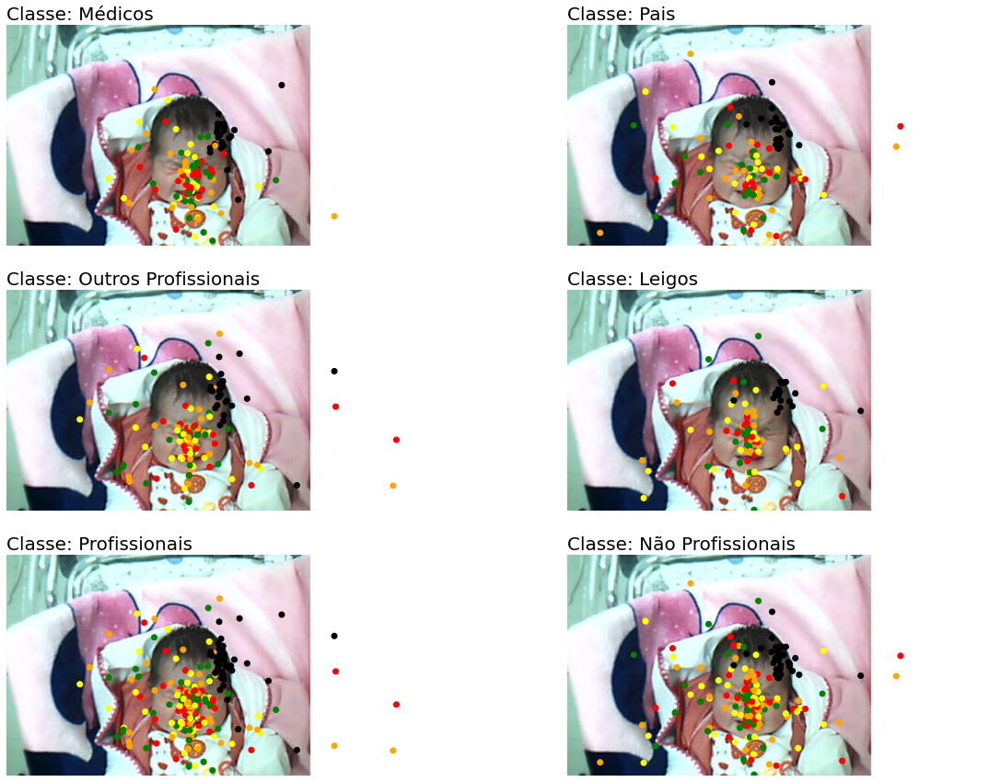

In [299]:
result_id(stimuli[1]) # Pain

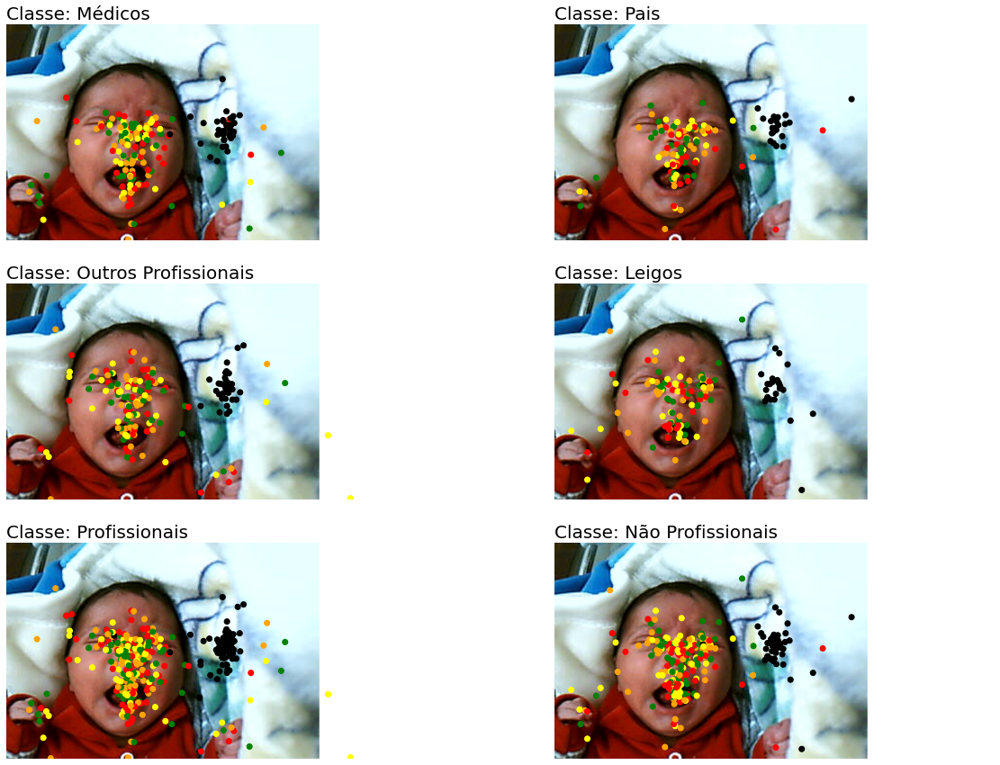

In [300]:
result_id(stimuli[2]) # Pain

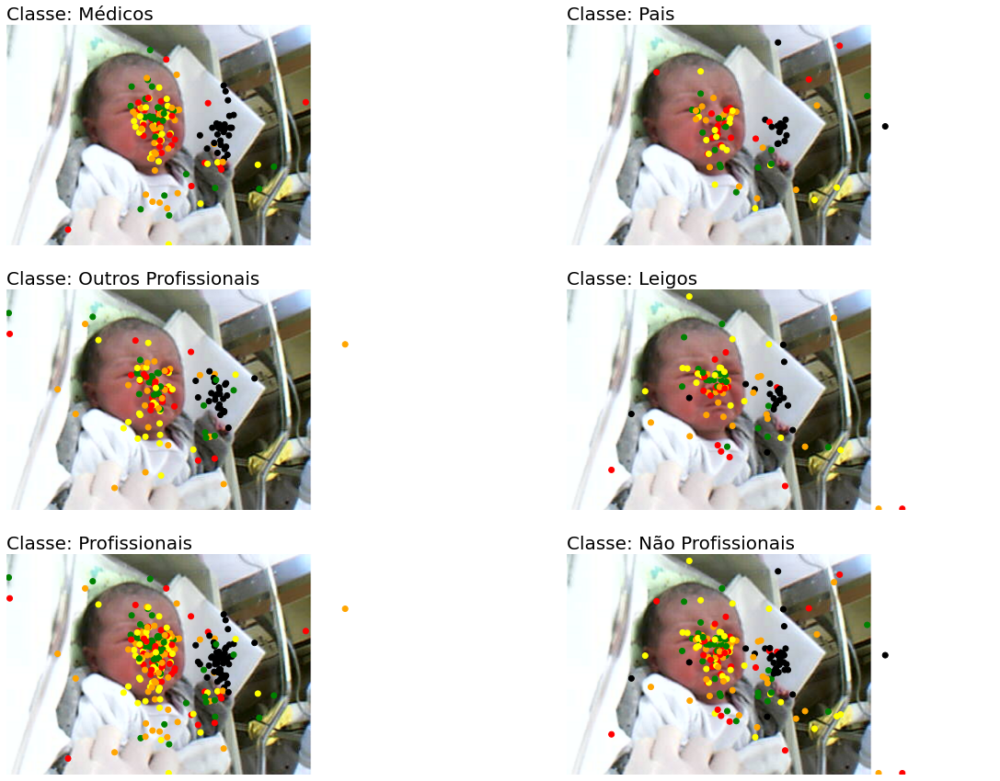

In [301]:
result_id(stimuli[3]) # Pain

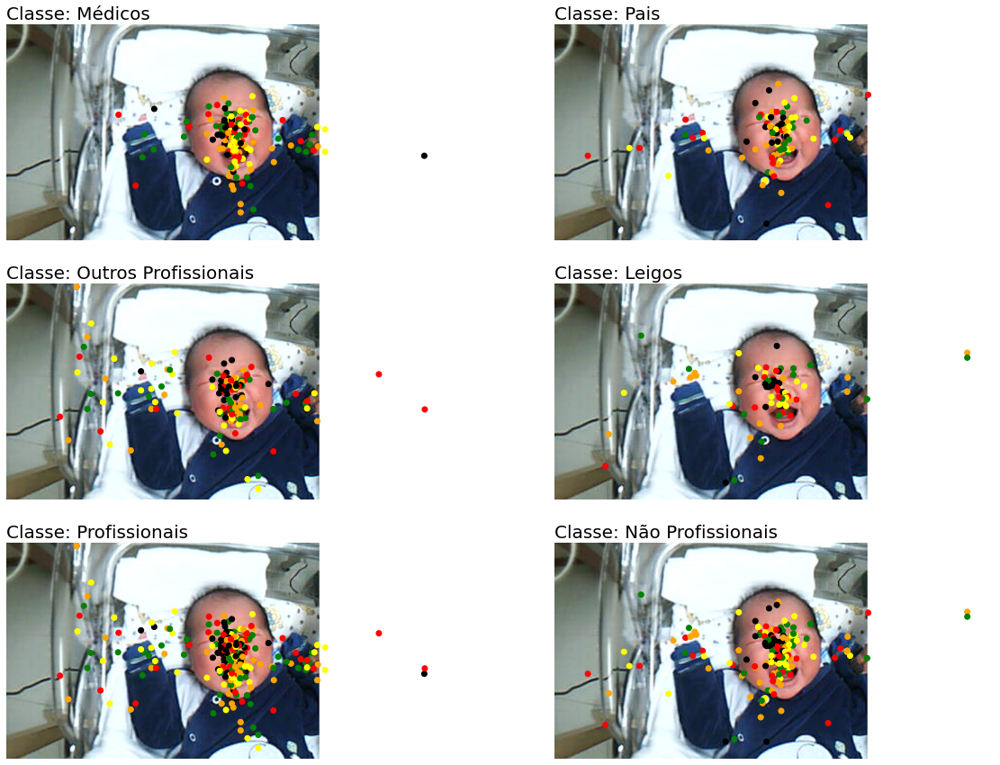

In [302]:
result_id(stimuli[4]) # Pain

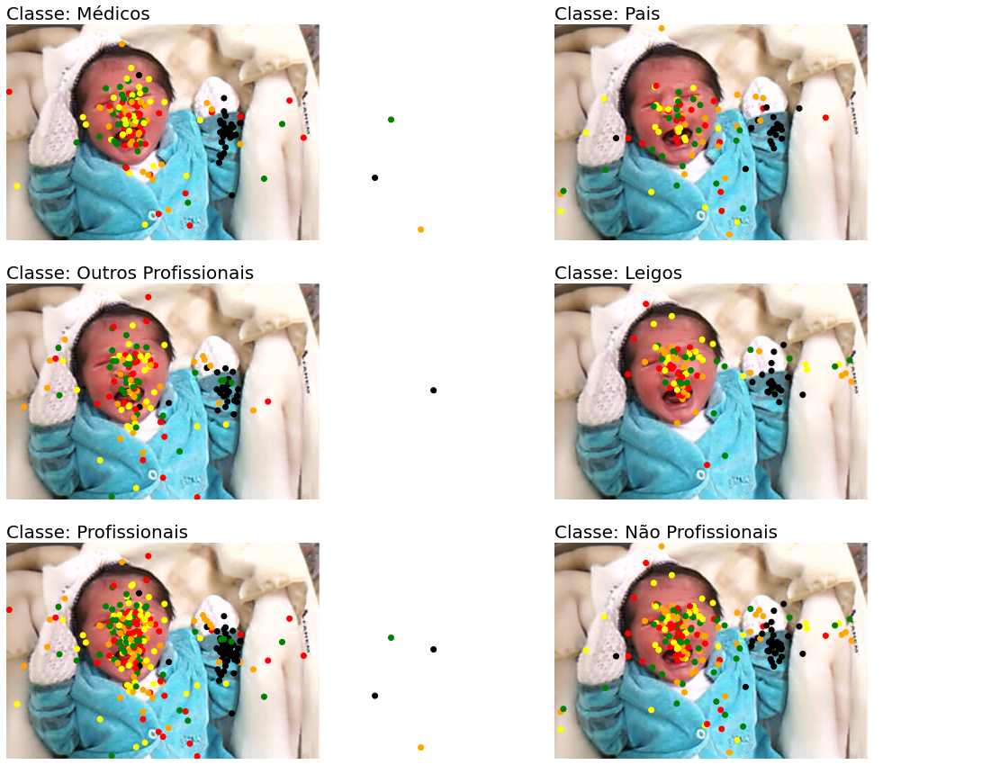

In [303]:
result_id(stimuli[5]) # Pain

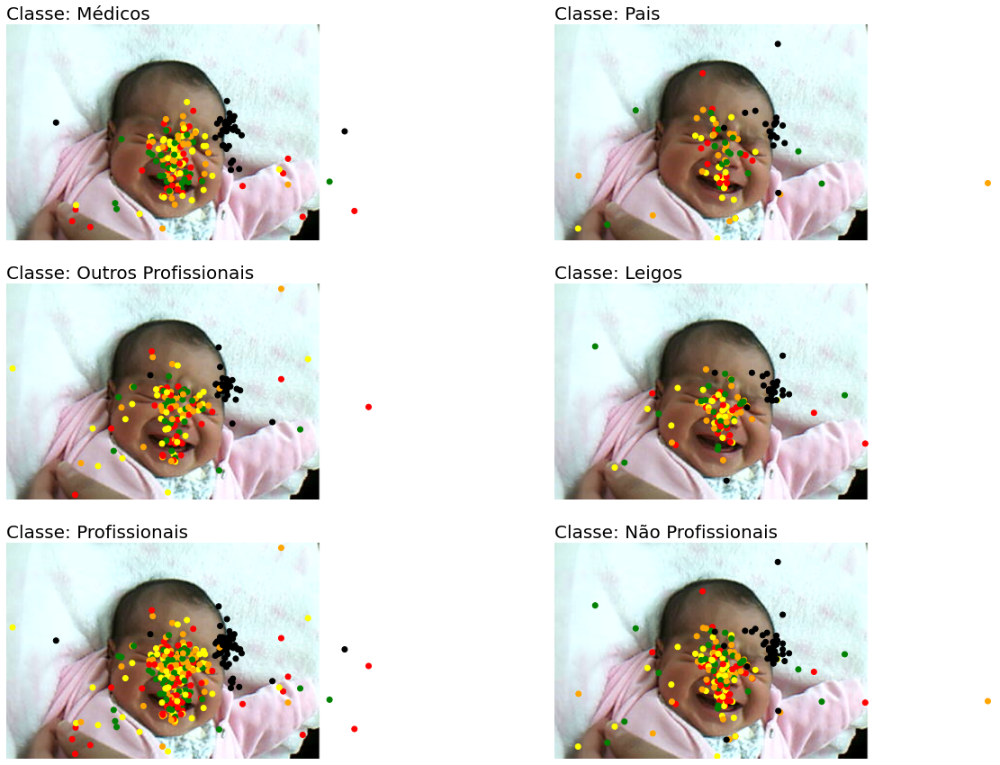

In [304]:
result_id(stimuli[6]) # Pain

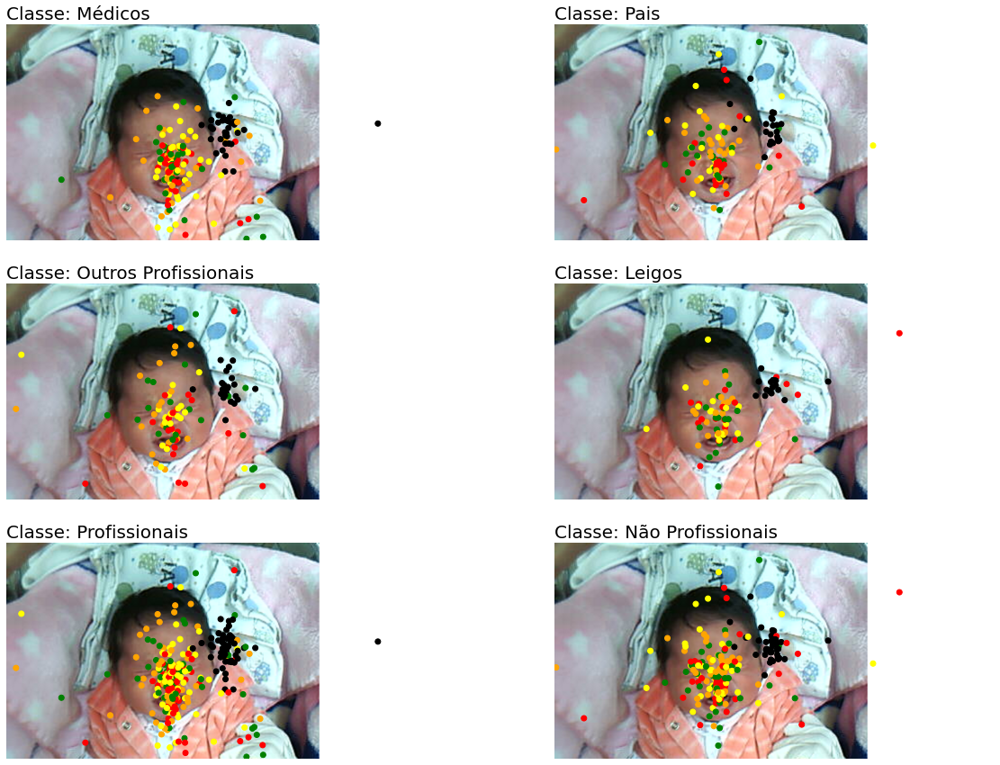

In [305]:
result_id(stimuli[7]) # Pain

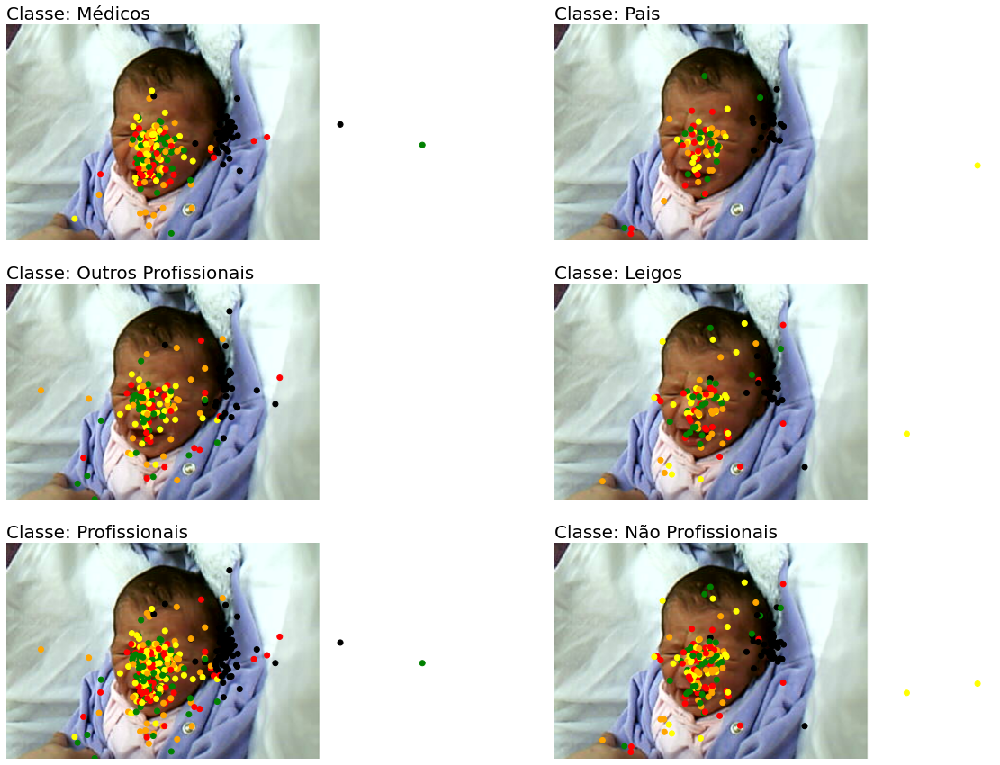

In [306]:
result_id(stimuli[8]) # Pain

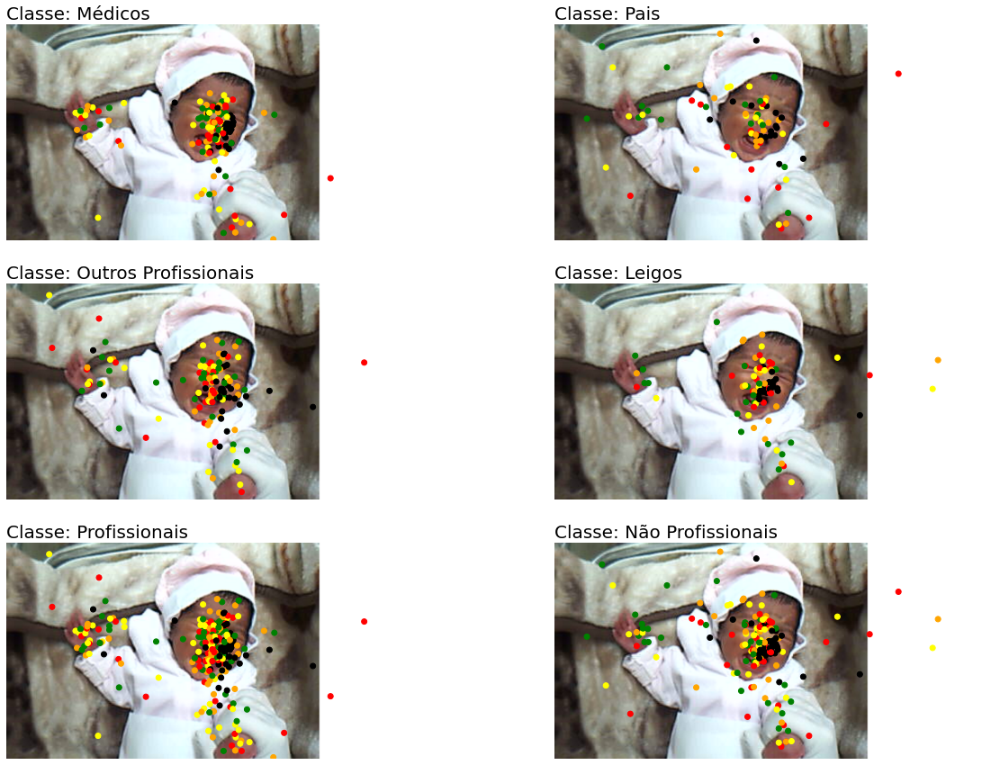

In [307]:
result_id(stimuli[9]) # Pain

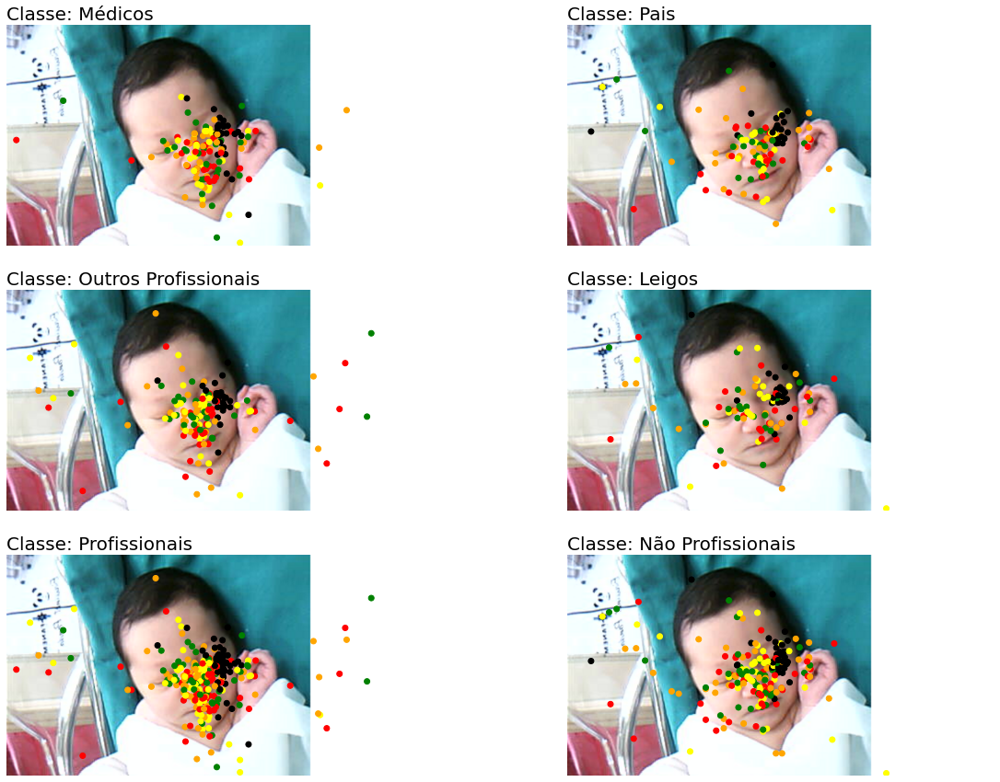

In [308]:
result_id(stimuli[10]) # Painless

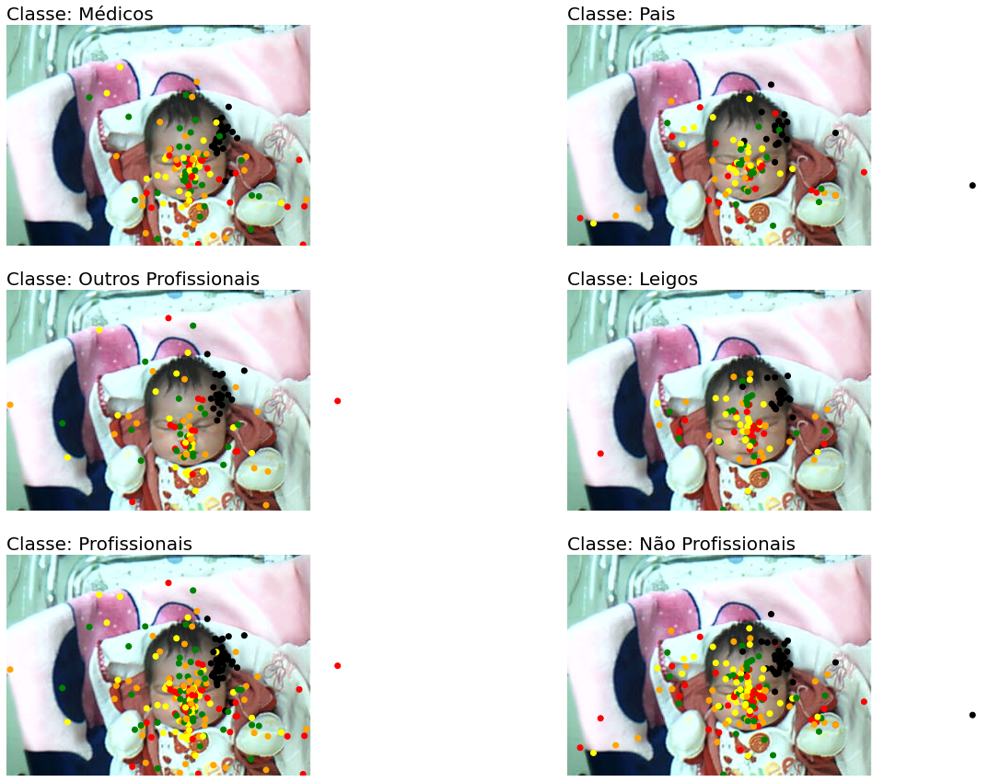

In [309]:
result_id(stimuli[11]) # Painless

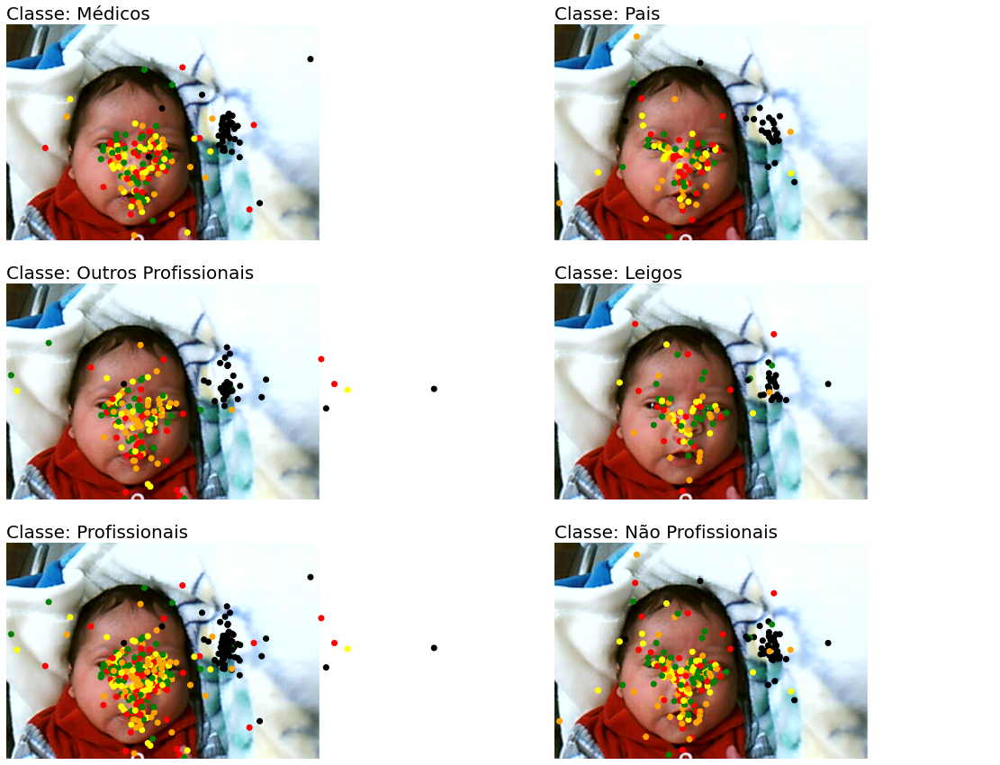

In [310]:
result_id(stimuli[12]) # Painless

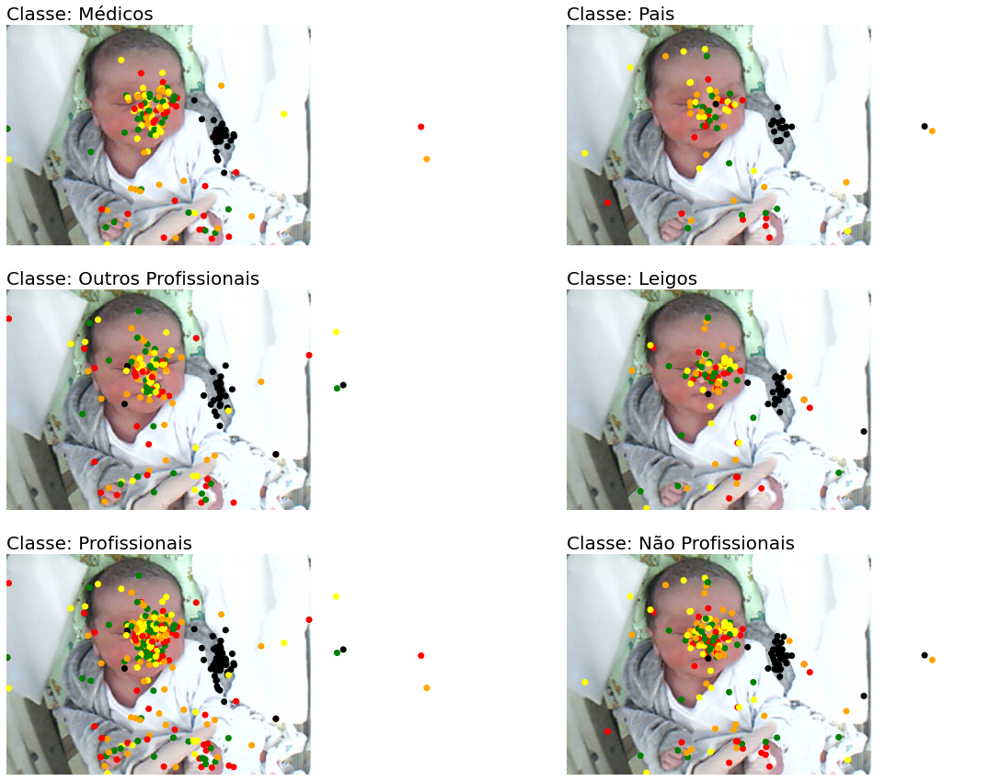

In [311]:
result_id(stimuli[13]) # Painless

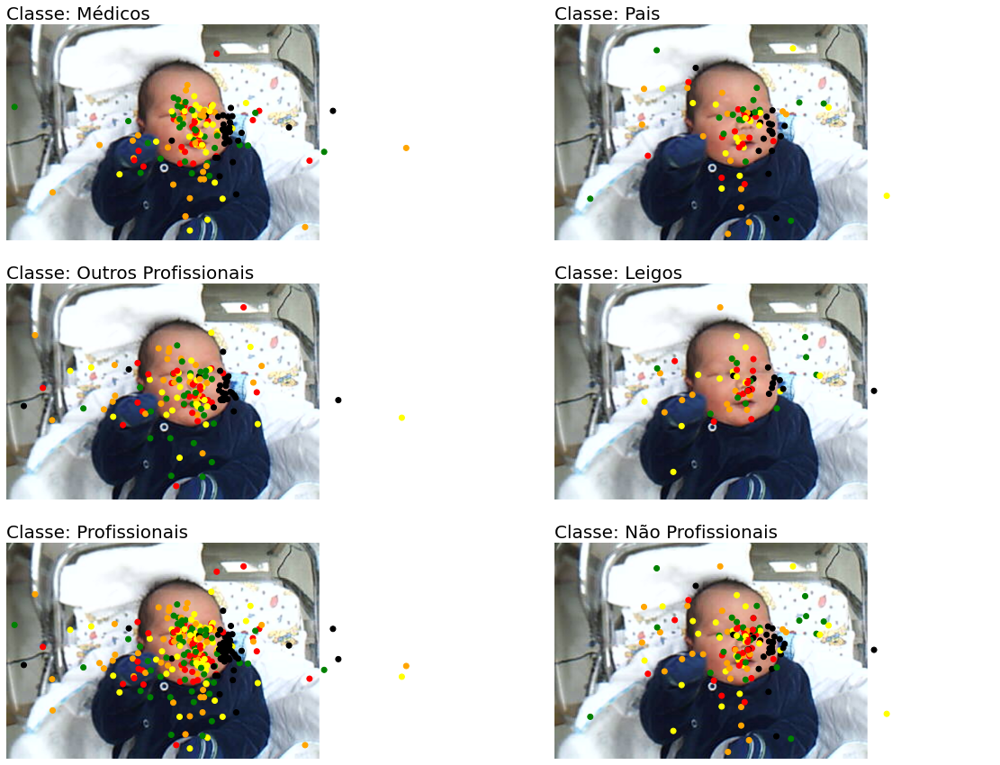

In [312]:
result_id(stimuli[14]) # Painless

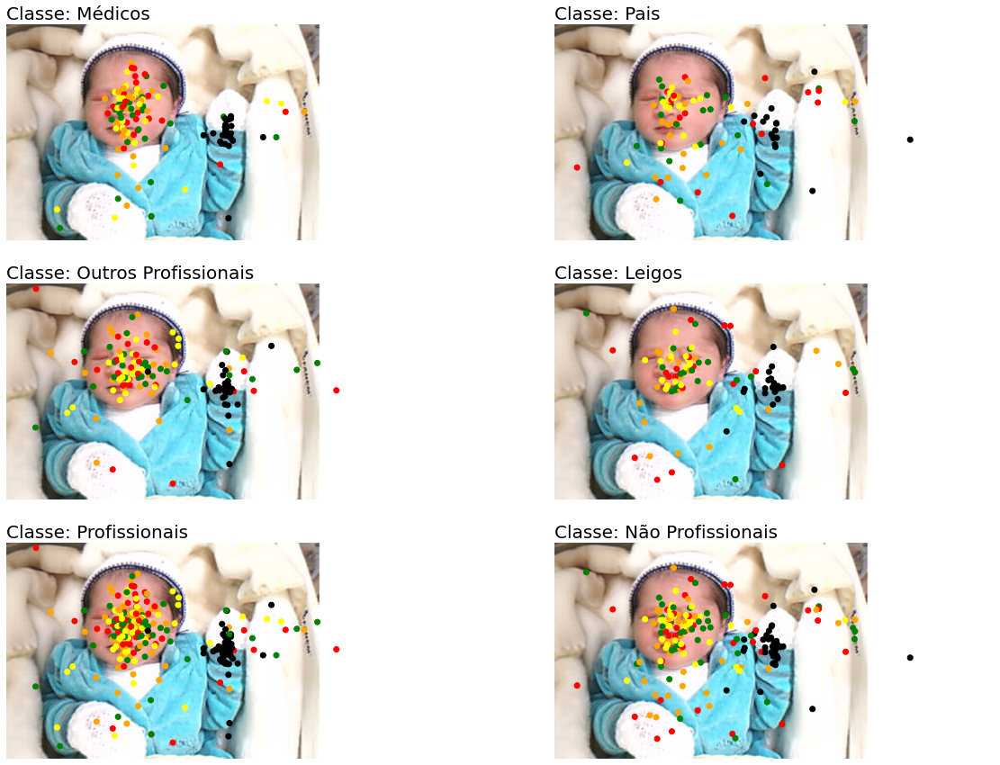

In [313]:
result_id(stimuli[15]) # Painless

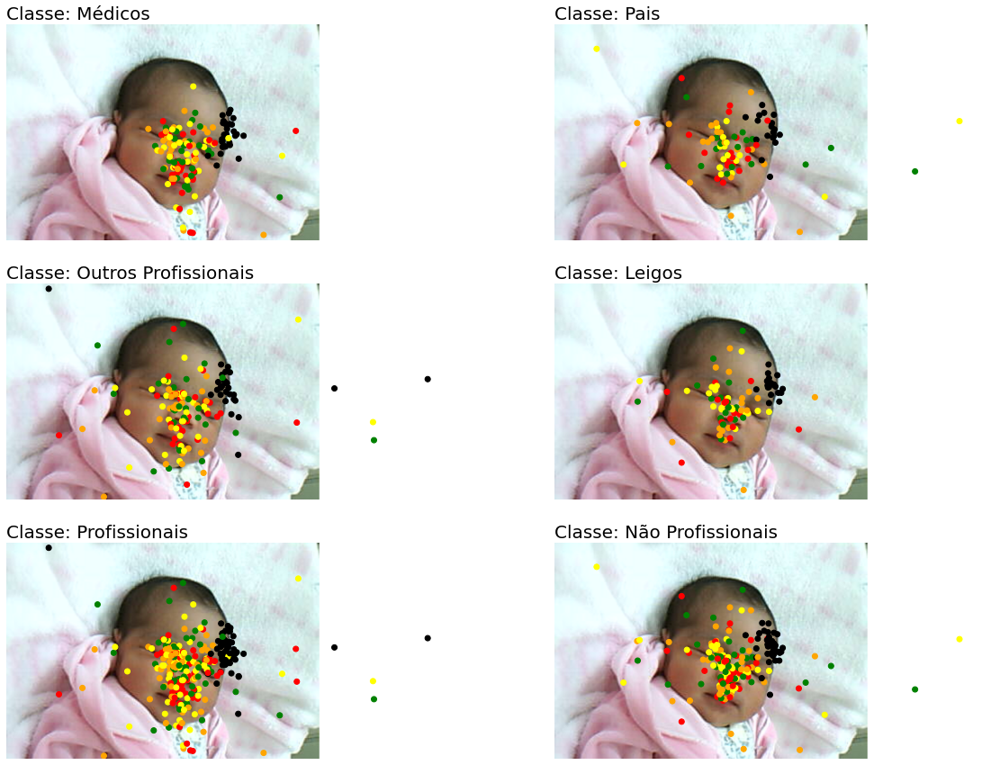

In [314]:
result_id(stimuli[16]) # Painless

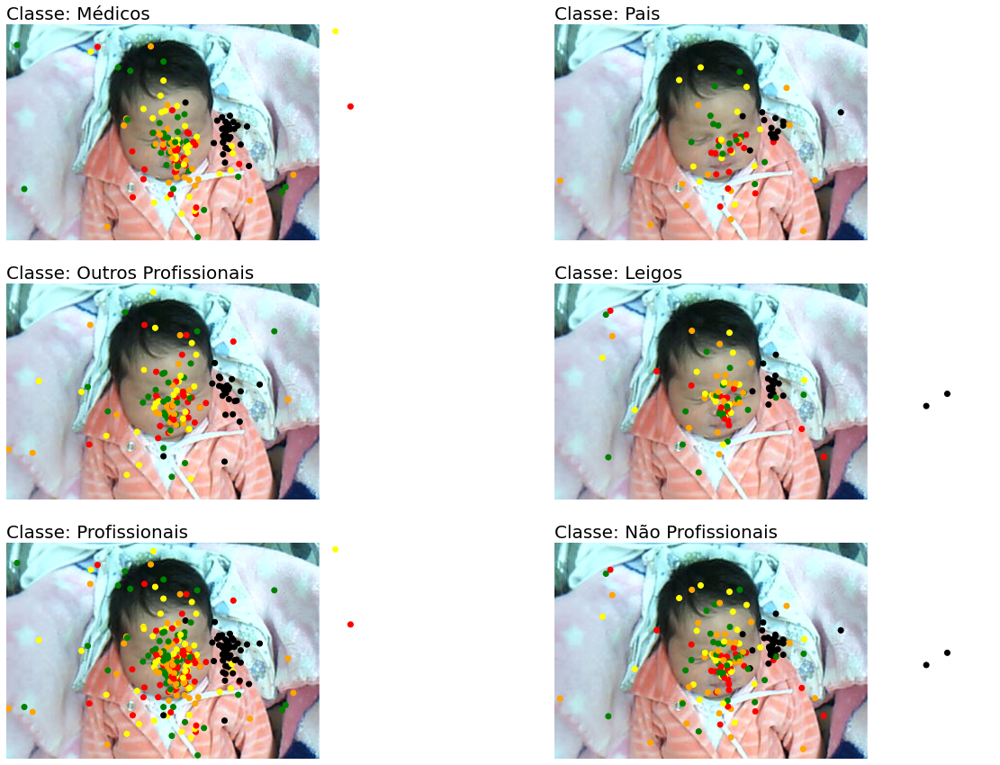

In [315]:
result_id(stimuli[17]) # Painless

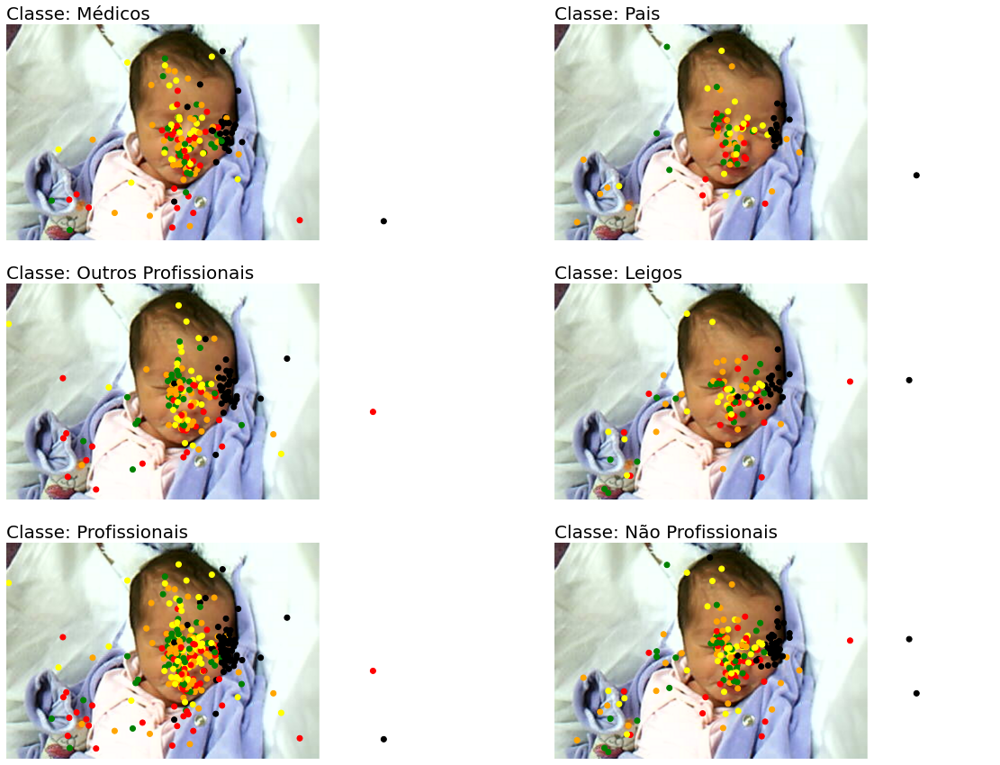

In [316]:
result_id(stimuli[18]) # Painless

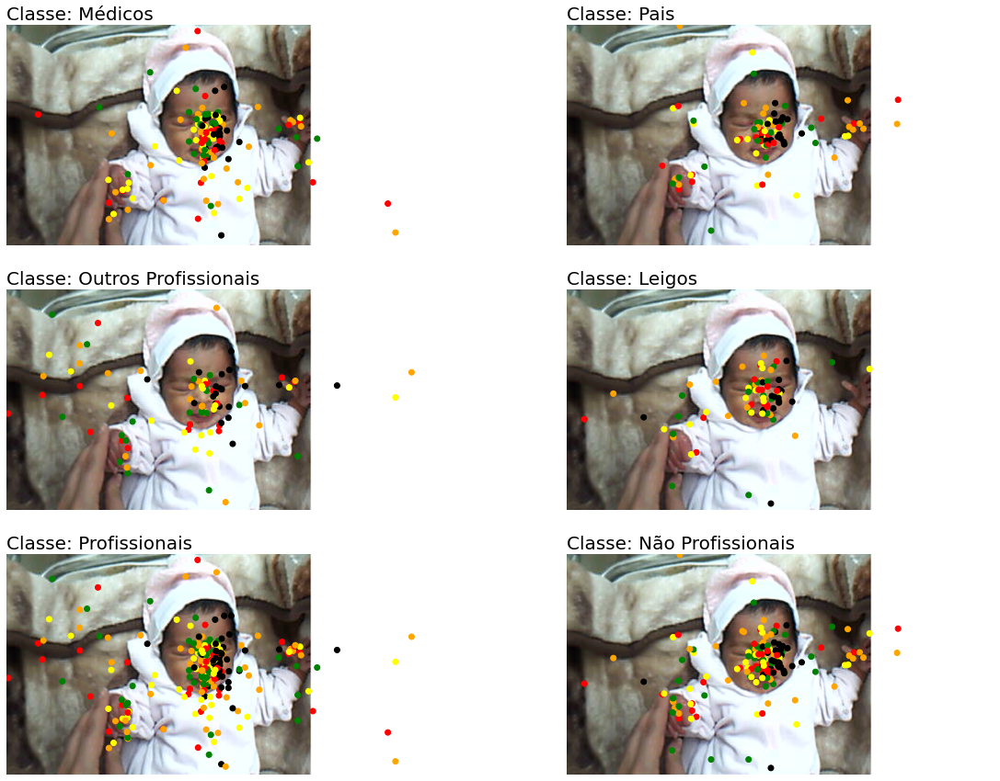

In [317]:
result_id(stimuli[19]) # Painless